# Finetuned SAM2 Inference Tasks

## Image Segmentation Inference

In [1]:
import numpy as np
import torch
import cv2
import os
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor
from pathlib import Path
from PIL import Image

In [2]:
# - unpack test tif dataset to png dataset
data_dir= Path("./snemi/" )
raw_image_dir = data_dir / 'image'
raw_image_tif_path = raw_image_dir / os.listdir(raw_image_dir)[1]
save_dir = data_dir / 'image_test_pngs'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

with Image.open(raw_image_tif_path) as img:
    for i in range(img.n_frames):
        temp_filename = f'image{i:04d}.png'
        if os.path.exists(save_dir / temp_filename):
            continue
        img.seek(i)
        img.save(save_dir / temp_filename)

In [3]:
# - load validation dataset the rest 2- png datasets
valid_image_dir= data_dir / 'image_pngs'
save_seg_dir = data_dir / 'seg_pngs'


data = []
for ff, name in enumerate(os.listdir(valid_image_dir)):
    data.append({'image': valid_image_dir / f'image{ff:04d}.png', 'annotation': save_seg_dir / f'seg{ff:04d}.png'})
# - split train dataset and validation dataset
valid_data = data[80:]

In [4]:
torch.autocast(device_type="cuda", dtype=torch.bfloat16).__enter__()
image_path = save_dir / 'image0000.png'

img = cv2.imread(str(image_path))


In [5]:
# - randomly get 30 points (we best use bounding box to do this task)
num_samples = 30
def get_points(mask,num_points): # Sample points inside the input mask
        points=[]
        for i in range(num_points):
            coords = np.argwhere(mask > 0)
            yx = np.array(coords[np.random.randint(len(coords))])
            points.append([[yx[1], yx[0]]])
        return np.array(points)
input_points = get_points(img,num_samples)

In [6]:
# - load fine-tuning parameters
sam2_checkpoint = "./sam2_hiera_large.pt"
model_cfg = "./sam2_hiera_l.yaml"
sam2_model = build_sam2(model_cfg, sam2_checkpoint, device='cpu')
predictor = SAM2ImagePredictor(sam2_model)
predictor.model.load_state_dict(torch.load("large_model.torch"))

<All keys matched successfully>

In [7]:
with torch.no_grad(): # prevent the net from caclulate gradient (more efficient inference)
        predictor.set_image(img) # image encoder
        masks, scores, logits = predictor.predict(  # prompt encoder + mask decoder
            point_coords=input_points,
            point_labels=np.ones([input_points.shape[0],1])
        )

In [8]:
# - sort masks and their predicted scores
masks=masks[:,0].astype(bool)
shorted_masks = masks[np.argsort(scores[:,0])][::-1].astype(bool)

In [9]:
# - create an empty segmentation map
seg_map = np.zeros_like(shorted_masks[0],dtype=np.uint8)
occupancy_mask = np.zeros_like(shorted_masks[0],dtype=bool)

In [10]:
# - add the masks one by one from high to low score
for i in range(shorted_masks.shape[0]):
    mask = shorted_masks[i]
    if (mask*occupancy_mask).sum()/mask.sum()>0.15: continue 
    mask[occupancy_mask]=0
    seg_map[mask]=i+1
    occupancy_mask[mask]=1

In [11]:
rgb_image = np.zeros((seg_map.shape[0], seg_map.shape[1], 3), dtype=np.uint8)
for id_class in range(1,seg_map.max()+1):
    rgb_image[seg_map == id_class] = [np.random.randint(255), np.random.randint(255), np.random.randint(255)]

In [12]:
# cv2.imshow("annotation",rgb_image)
# cv2.imshow("mix",(rgb_image/2+img/2).astype(np.uint8))
# cv2.imshow("image",img)
# cv2.waitKey()

### Check Validation Dataset Performance

In [13]:
import os
import numpy as np
import torch
import matplotlib.pyplot as plt

import torchvision.transforms.functional as F
from torchvision.ops import masks_to_boxes
import os
# if using Apple MPS, fall back to CPU for unsupported ops
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image



In [14]:
# - image visualization
np.random.seed(3)


def show_mask(mask, ax, random_color=False, borders = True):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask = mask.astype(np.uint8)
    mask_image =  mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    if borders:
        import cv2
        contours, _ = cv2.findContours(mask,cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) 
        # Try to smooth contours
        contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
        mask_image = cv2.drawContours(mask_image, contours, -1, (1, 1, 1, 0.5), thickness=2) 
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))    

def show_masks(image, masks, scores, point_coords=None, box_coords=None, input_labels=None, borders=True):
    for i, (mask, score) in enumerate(zip(masks, scores)):
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        show_mask(mask, plt.gca(), borders=borders)
        if point_coords is not None:
            assert input_labels is not None
            show_points(point_coords, input_labels, plt.gca())
        if box_coords is not None:
            # boxes
            show_box(box_coords, plt.gca())
        if len(scores) > 1:
            plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
        plt.axis('off')
        plt.show()

In [15]:
# use bfloat16 for the entire script (memory efficient)
torch.autocast(device_type="cuda", dtype=torch.bfloat16).__enter__()

image_path = valid_data[0]['image'] # path to image
mask_path = valid_data[0]['annotation'] # path to mask, the mask will define the image region to segment
def read_image(image_path, mask_path): # read and resize image and mask
        img = cv2.imread(str(image_path)) # read image as rgb
        mask = np.array(Image.open(mask_path)) # mask of the region we want to segment
        
        # Resize image to maximum size of 1024

        r = np.min([1024 / img.shape[1], 1024 / img.shape[0]])
        img = cv2.resize(img, (int(img.shape[1] * r), int(img.shape[0] * r)))
        mask = cv2.resize(mask, (int(mask.shape[1] * r), int(mask.shape[0] * r)),interpolation=cv2.INTER_NEAREST)
        return img, mask
image,mask = read_image(image_path, mask_path)
# num_samples = len(np.unique(mask)) # number of points/segment to sample
# print(num_samples)
num_samples = 1000
def get_points(mask,num_points): # Sample points inside the input mask
        points=[]
        for i in range(num_points):
            coords = np.argwhere(mask > 0)
            yx = np.array(coords[np.random.randint(len(coords))])
            points.append([[yx[1], yx[0]]])
        return np.array(points)
input_points = get_points(mask,num_samples)


In [16]:
# - convert mask into bounding boxes


mat_map = mask
inds = np.unique(mat_map)[1:] # load all indices

masks = [] 
for ind in inds:

    masks.append(mask == ind)

masks = np.array(masks)
masks_tensor = torch.from_numpy(masks)

boxes = masks_to_boxes(masks_tensor)
input_boxes = boxes.numpy()


In [17]:
# - load fine-tuning parameters

sam2_checkpoint = "./sam2_hiera_large.pt"
model_cfg = "./sam2_hiera_l.yaml"
sam2_model = build_sam2(model_cfg, sam2_checkpoint, device='cpu')
predictor = SAM2ImagePredictor(sam2_model)
predictor.model.load_state_dict(torch.load("./checkpoints/large_model8163.torch"))

with torch.no_grad(): # prevent the net from caclulate gradient (more efficient inference)
        predictor.set_image(image) # image encoder
        masks, scores, logits = predictor.predict(  # prompt encoder + mask decoder
            point_coords=input_points,
            point_labels=np.ones([input_points.shape[0],1])
        )

masks=masks[:,0].astype(bool)
shorted_masks = masks[np.argsort(scores[:,0])][::-1].astype(bool)
seg_map = np.zeros_like(shorted_masks[0],dtype=np.uint8)
occupancy_mask = np.zeros_like(shorted_masks[0],dtype=bool)
for i in range(shorted_masks.shape[0]):
    mask = shorted_masks[i]
    if (mask*occupancy_mask).sum()/mask.sum()>0.50: continue 
    mask[occupancy_mask]=0
    seg_map[mask]=i+1
    occupancy_mask[mask]=1
rgb_image = np.zeros((seg_map.shape[0], seg_map.shape[1], 3), dtype=np.uint8)
for id_class in range(1,seg_map.max()+1):
    rgb_image[seg_map == id_class] = [np.random.randint(255), np.random.randint(255), np.random.randint(255)]

/tmp/ipykernel_3834501/291382139.py:24: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of 258 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)
will give the desired result (the cast overflows).
  seg_map[mask]=i+1
/tmp/ipykernel_3834501/291382139.py:24: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of 261 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)
will give the desired result (the cast overflows).
  seg_map[mask]=i+1
/tmp/ipykernel_3834501/291382139.py:24: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of 264 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)
will give the desired result (the cast overflows).


In [18]:
# cv2.imshow("annotation",rgb_image)
# cv2.imshow("mix",(rgb_image/2+image/2).astype(np.uint8))
# cv2.imshow("image",image)
# cv2.waitKey()

In [19]:
input_points_lst = []
for i in range(13):
    input_points_lst.append(np.array([[np.random.uniform(box[0], box[2]), np.random.uniform(box[1], box[3])] for box in input_boxes]))    
input_points_lst = np.array(input_points_lst)


In [20]:
input_points_lst = input_points_lst.reshape(input_points_lst.shape[0] * input_points_lst.shape[1], 1, input_points_lst.shape[2])

In [21]:
with torch.no_grad(): # prevent the net from caclulate gradient (more efficient inference)
    predictor.set_image(image) # image encoder
    masks, scores, logits = predictor.predict(  # prompt encoder + mask decoder
        point_coords=input_points_lst,
        point_labels=np.ones([input_points_lst.shape[0], 1]),
        multimask_output=False,
        )
    # masks, scores, logits = predictor.predict(  # prompt encoder + mask decoder
    #     point_coords=None,
    #     point_labels=None,
    #     multimask_output=False,
    #     box = input_boxes
    #     )
masks=masks[:,0].astype(bool)
shorted_masks = masks[np.argsort(scores[:,0])][::-1].astype(bool)


In [22]:
seg_map = np.zeros_like(shorted_masks[0],dtype=np.uint8)
occupancy_mask = np.zeros_like(shorted_masks[0],dtype=bool)
for i in range(shorted_masks.shape[0]):
    mask = shorted_masks[i]
    if (mask*occupancy_mask).sum()/mask.sum()>0.3: continue 
    mask[occupancy_mask]=0
    seg_map[mask]=i+1
    occupancy_mask[mask]=1

rgb_image = np.zeros((seg_map.shape[0], seg_map.shape[1], 3), dtype=np.uint8)
for id_class in range(1,seg_map.max()+1):
    rgb_image[seg_map == id_class] = [np.random.randint(255), np.random.randint(255), np.random.randint(255)]

/tmp/ipykernel_3834501/2611138245.py:7: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of 258 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)
will give the desired result (the cast overflows).
  seg_map[mask]=i+1
/tmp/ipykernel_3834501/2611138245.py:7: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of 265 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)
will give the desired result (the cast overflows).
  seg_map[mask]=i+1
/tmp/ipykernel_3834501/2611138245.py:7: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of 272 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)
will give the desired result (the cast overflows).


In [23]:
cv2.imshow("annotation",rgb_image)
cv2.imshow("mix",(rgb_image/2+image/2).astype(np.uint8))
cv2.imshow("image",image)
cv2.waitKey()

In [ ]:
# plt.figure(figsize=(10, 10))
# plt.imshow(image)
# for mask in masks:
#     show_mask(mask.squeeze(0), plt.gca(), random_color=True)
# for box in input_boxes:
#     show_box(box, plt.gca())
# plt.axis('off')
# plt.show()

In [ ]:
# cv2.imshow("annotation",rgb_image)
# cv2.imshow("mix",(rgb_image/2+image/2).astype(np.uint8))
# cv2.imshow("image",image)
# cv2.waitKey()

### Automatically Generate Masks

In [ ]:
import os
# if using Apple MPS, fall back to CPU for unsupported ops
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image

In [ ]:
# select the device for computation
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

if device.type == "cuda":
    # use bfloat16 for the entire notebook
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    # turn on tfloat32 for Ampere GPUs (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True
elif device.type == "mps":
    print(
        "\nSupport for MPS devices is preliminary. SAM 2 is trained with CUDA and might "
        "give numerically different outputs and sometimes degraded performance on MPS. "
        "See e.g. https://github.com/pytorch/pytorch/issues/84936 for a discussion."
    )

using device: cuda


In [ ]:
np.random.seed(3)

def show_anns(anns, borders=True):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:, :, 3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.5]])
        img[m] = color_mask 
        if borders:
            import cv2
            contours, _ = cv2.findContours(m.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) 
            # Try to smooth contours
            contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
            cv2.drawContours(img, contours, -1, (0, 0, 1, 0.4), thickness=1) 

    ax.imshow(img)

In [ ]:
# - experiment with trained image
train_image_path = data_dir / 'image_pngs' / 'image0000.png'
train_image_sample = Image.open(train_image_path)
train_image = np.array(train_image_sample.convert("RGB"))

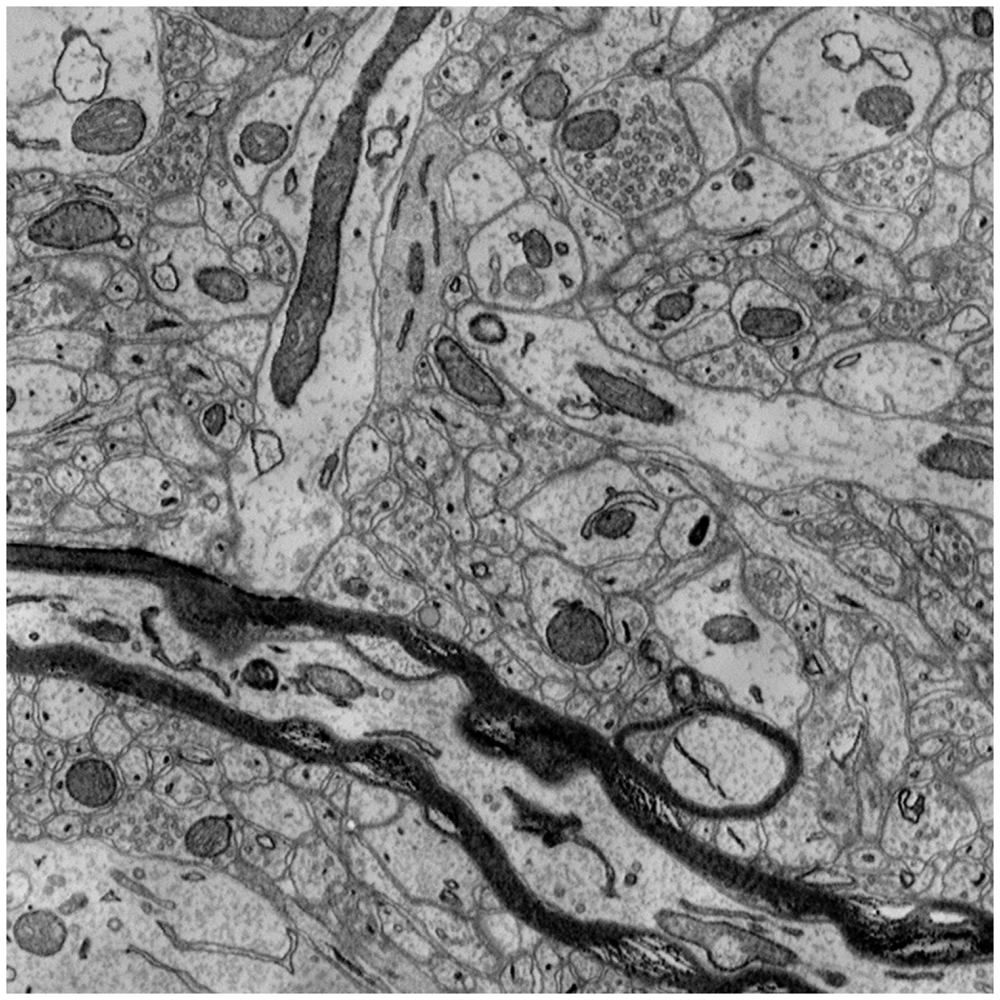

In [ ]:
# - experiment with test image
image_sample = Image.open(image_path)
image = np.array(image_sample.convert("RGB"))
plt.figure(figsize=(20, 20))
plt.imshow(image)
plt.axis('off')
plt.show()


In [ ]:
from sam2.build_sam import build_sam2
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator

sam2_checkpoint = "./sam2_hiera_large.pt"
model_cfg = "./sam2_hiera_l.yaml"

sam2 = build_sam2(model_cfg, sam2_checkpoint, device=device, apply_postprocessing=False)

mask_generator = SAM2AutomaticMaskGenerator(sam2)

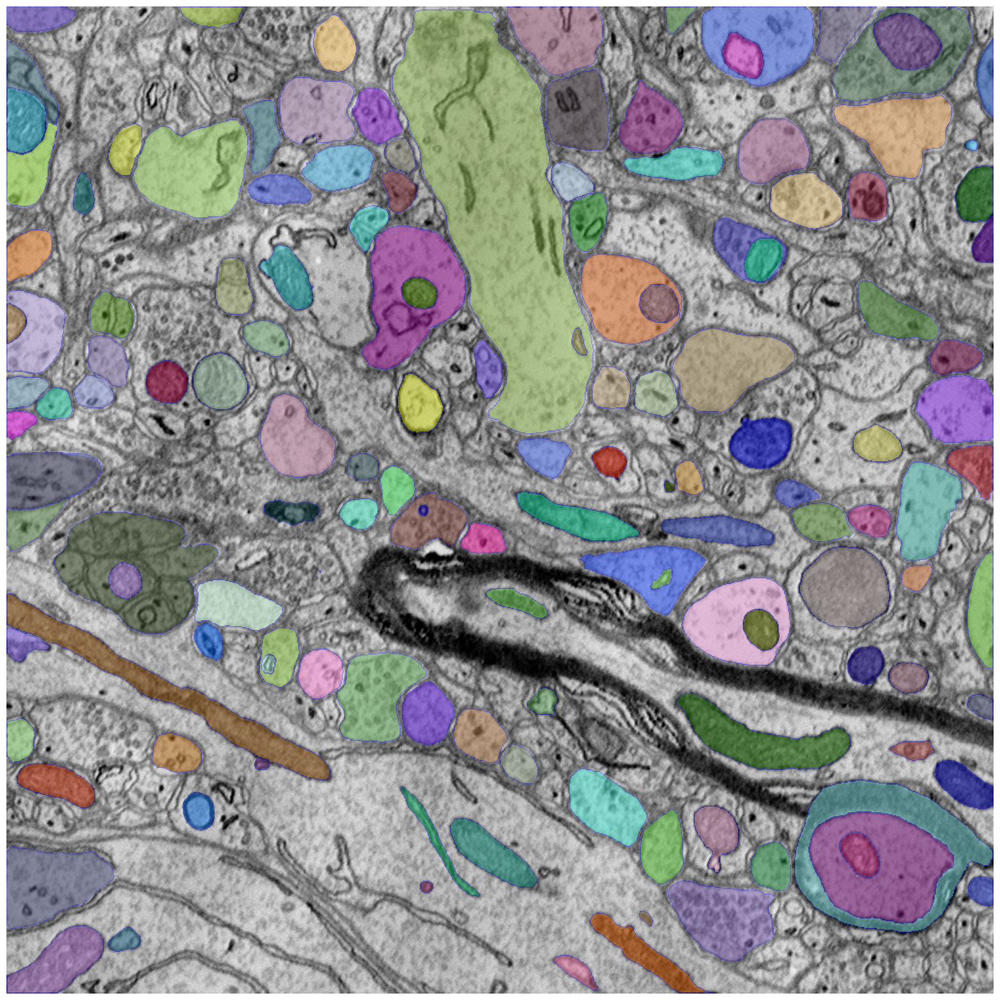

In [ ]:
# - default large model + train image
train_masks = mask_generator.generate(train_image)
plt.figure(figsize=(20, 20))
plt.imshow(train_image)
show_anns(train_masks)
plt.axis('off')
plt.show() 

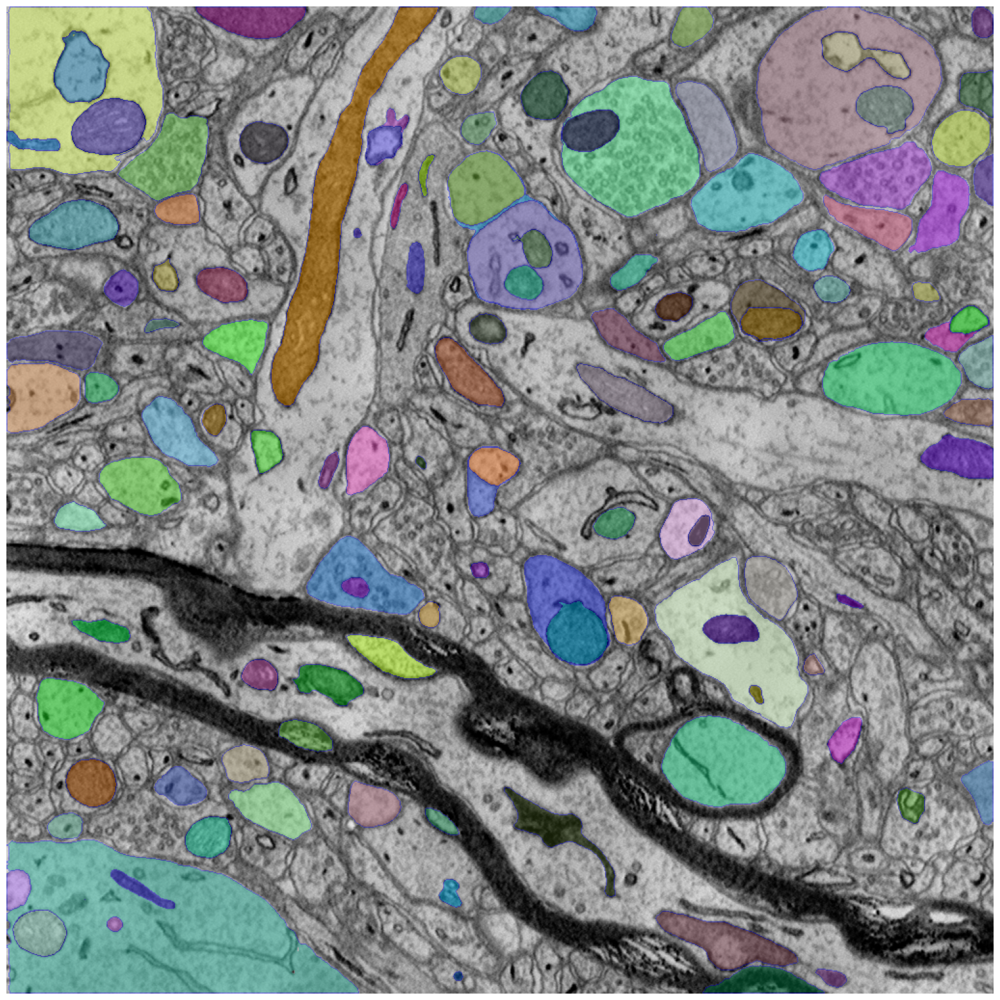

In [ ]:
# - default large model + test image
masks = mask_generator.generate(image)
plt.figure(figsize=(20, 20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show() 

In [ ]:
# - load finetuned parameter (doubt mask generator doesn't efficiently utilize finetuned predictor)
mask_generator.predictor.model.load_state_dict(torch.load("large_model.torch"))

<All keys matched successfully>

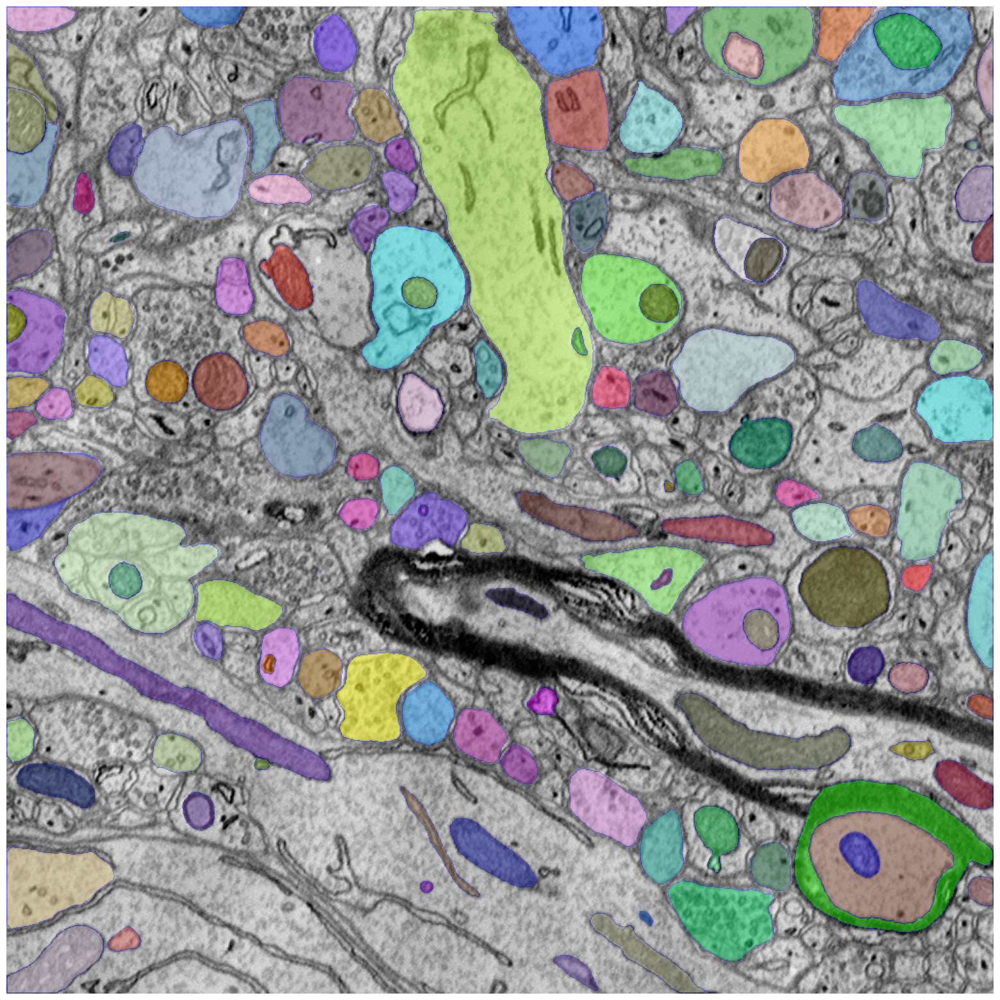

In [ ]:
# - finetued predictor + train image
train_masks = mask_generator.generate(train_image)
plt.figure(figsize=(20, 20))
plt.imshow(train_image)
show_anns(train_masks)
plt.axis('off')
plt.show() 

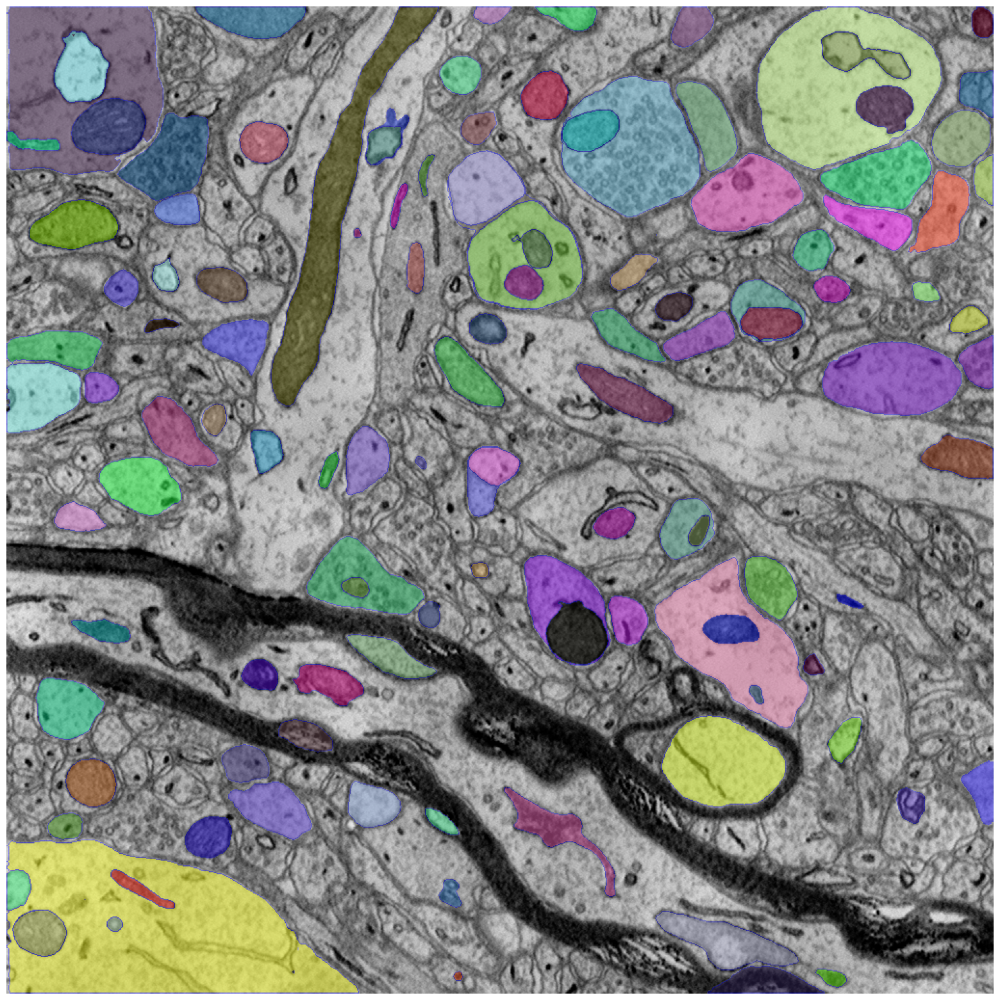

: 

In [ ]:
# - finetunelarge model + test image
masks = mask_generator.generate(image)
plt.figure(figsize=(20, 20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show() 